In [43]:
using DrWatson
@quickactivate "Doran_etal_2022"

using StatsPlots
using StatsBase
using Muon, CSV, DataFrames

theme(:default, grid=false, label="")
gr()

Plots.GRBackend()

In [113]:
ddir = datadir("exp_pro", "BB669")
pdir = plotsdir("specieslevel_metabolite_strainvariation") |> mkpath

"/Users/ben/projects/Doran_etal_2022/plots/specieslevel_metabolite_strainvariation"

In [3]:
biobank = readh5mu(joinpath(ddir, "BB669.h5mu"))

┌ Warning: Cannot join columns with the same name because var_names are intersecting.
└ @ Muon /Users/ben/.julia/packages/Muon/eLqpV/src/mudata.jl:351


MuData object 669 ✕ 21473
└ metabolites_foldchange
  AnnData object 669 ✕ 38
└ metabolites_millimolar
  AnnData object 669 ✕ 10
└ UPorder_oggs
  AnnData object 669 ✕ 10177
└ oggs
  AnnData object 669 ✕ 11248

In [9]:
metmtx = biobank["metabolites_foldchange"].X[:, :];

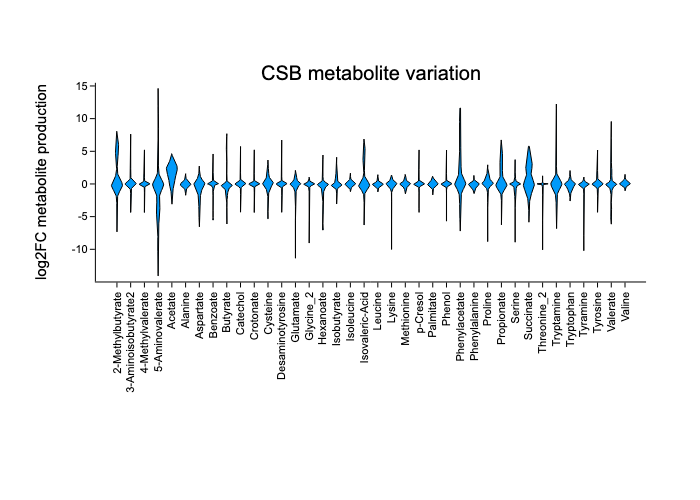

In [18]:
violin(
    metmtx,
    title="CSB metabolite variation",
    ylabel="log2FC metabolite production",
    xticks=(1:size(metmtx, 2), replace.(biobank["metabolites_foldchange"].var_names, "_rel"=>"")),
    xrotation=90,
    c=1,
    tickdirection=:out,
)

In [77]:
strvarspecies = string.(keys(sort(filter(x-> last(x) > 19, countmap(biobank.obs.species)), byvalue=true, rev=true)))
filter!(!=("unclassified"), strvarspecies)

11-element Vector{String}:
 "Phocaeicola vulgatus"
 "[Ruminococcus] gnavus"
 "Bacteroides thetaiotaomicron"
 "Anaerostipes hadrus"
 "Bacteroides uniformis"
 "Blautia luti"
 "Bifidobacterium breve"
 "Coprococcus comes"
 "Dorea formicigenerans"
 "Blautia wexlerae"
 "[Eubacterium] rectale"

In [78]:
specieslabels = [
    "Bacteroides uniformis",
    "Phocaeicola vulgatus",
    "Bacteroides thetaiotaomicron",
    "[Ruminococcus] gnavus",
    "Bifidobacterium breve",
    "[Eubacterium] rectale",
    "Dorea formicigenerans",
    "Coprococcus comes",
    "Blautia luti & Blautia wexlerae",
    "Anaerostipes hadrus",
]
speciescolors = wload(datadir("exp_pro", "BB728", "subsettreecolors.jld2"))["colors"]
speciescolors_ordered = permutedims(speciescolors[replace(indexin(strvarspecies, specieslabels), nothing=>9)])

In [111]:
ps = []
for (i, species) in enumerate(strvarspecies)
    speciesmask = occursin.(species, biobank.obs.species)
    p = violin(permutedims(1:size(metmtx, 2)),
        metmtx[speciesmask, :],
        ylabel=last(split(species," ")),
        c=speciescolors_ordered[i],
        # side=:left,
        xticks= i>=10 ? (1:size(metmtx, 2), replace.(biobank["metabolites_foldchange"].var_names, "_rel"=>"")) : (1:size(metmtx, 2), repeat([""], size(metmtx, 2))),
        xrotation=90,
    )
    dotplot!(permutedims(1:size(metmtx, 2)),
        metmtx[speciesmask, :], 
        c=:black, alpha=.2, markerstrokewidth=0, markersize=1,
        # side=:right
    )
    push!(ps, p)
end

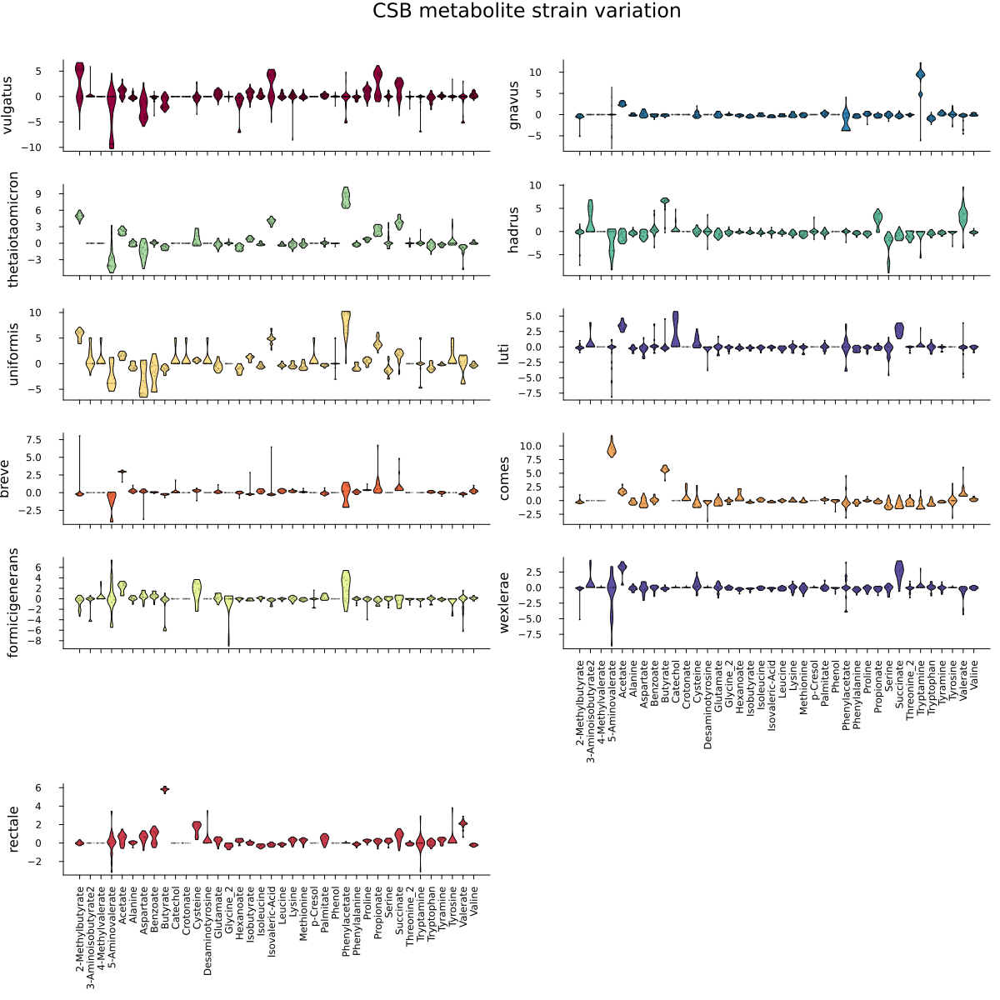

In [112]:
plot(ps..., 
    layout=grid(ceil(Int, length(strvarspecies)/2), 2), 
    plot_title = "CSB metabolite strain variation",
    size=(1200, 1200),
    tickdirection=:out,
)

In [114]:
savefig(joinpath(pdir, "violinplots_38metabolites_strainlevel_variation.pdf"))

"/Users/ben/projects/Doran_etal_2022/plots/specieslevel_metabolite_strainvariation/violinplots_38metabolites_strainlevel_variation.pdf"

In [117]:
clipboard(replace.(biobank["metabolites_foldchange"].var_names, "_rel"=>""))